In [115]:
#for reading files
import glob
import tifffile


#math computation and data organization
import numpy as np
import math
import scipy
from scipy.ndimage import binary_erosion, binary_fill_holes
from scipy import optimize
from scipy.optimize import curve_fit
import pandas as pd

# For loading bars
from tqdm.notebook import tqdm as tqdm

#For image plotting
import skimage.io

#For identifying aster center
from skimage.filters import threshold_otsu, gaussian, threshold_mean
from skimage.measure import regionprops
import cv2

#for fitting
from lmfit import minimize, Parameters, fit_report

#for image registration
from skimage.registration import phase_cross_correlation
import os

#Matplotlib plotting packages
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
import matplotlib.colors as mcolors
import matplotlib.cm as cm
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib import patches
from matplotlib import gridspec

import seaborn as sns

#Movie
import celluloid as cell
import matplotlib.animation as animation

#for saving data
import csv
import h5py

#custom analysis packages
import aster_packages as ap

# Thing to enable lovely parallelization
import concurrent.futures

# Enable repeat from itertools for parallel
import itertools

In [116]:
## IMPORTS
import pandas as pd
import numpy as np
import h5py
import glob

######### gabe hacky styling to emulate some of PBoC Phillips lab style conventions, however hacky. tries to make easier for nigel++
## Styling
import matplotlib
import matplotlib.ticker as ticker
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_context("poster")
# sns.set_style('ticks')

import matplotlib.colors as c
from mpl_toolkits.axes_grid1 import make_axes_locatable

# Set the property to save figures with text as text, not paths
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

# default good PBoC colors
baseBlendColor=(224/255, 219/255, 209/255,1) # default background for plots
contrastColor=(209/255, 193/255, 171/255,1) # slightly darker tan for contrasts, e.g. in inset boxes
yellowTanHighlightBoxColor='#FEF0C6'
goodGreyGreenArrowColor='#CCD4C9'

### Griffin style invocation

from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.path import Path
from matplotlib.patches import BoxStyle
from matplotlib.offsetbox import AnchoredText

def plotting_style(grid=False):
    """
    Sets the style to the publication style. To instantiate, simply call
    plotting_style() at the beginning of your script or notebook to force
    all matplotlib plots to adopt the scheme.

    Parameters
    ----------
    grid: bool
      If True, plots will have a thin, white grid in the background. Default
      is False.

    Returns
    -------
    colors: dict
      Returns a dictionary of the standard PBoC 2e color palette.
    """
    rc = {'axes.facecolor': '#E3DCD0',
#               'axes.spines.top': False,
#               'axes.spines.right': False,
#               'axes.spines.left': False,  # Ensure left spine is present
#               'axes.spines.bottom': False,  # Ensure bottom spine is present
#               'axes.spines.left': False, #{'color': '#E3DCD0', 'linewidth': 1.5},  # Set the spine color to the background color
#               'axes.spines.bottom': False, #{'color': '#E3DCD0', 'linewidth': 1.5},  # Set the spine color to the background color
          #'font.family': '/usr/share/fonts/truetype/LucidaSansOT.otf', #'LucidaSansOT.otf',
          'grid.linestyle': '-',
          'grid.linewidth': 0.5,
          'grid.alpha': 0.75,
          'grid.color': '#ffffff',
          'axes.grid': grid,
          'ytick.direction': 'in',
          'xtick.direction': 'in',
          'xtick.gridOn': grid,
          'ytick.gridOn': grid,
#               'ytick.major.width':8,
#               'xtick.major.width':8,
#               'ytick.major.size': 8,
#               'xtick.major.size': 8,
          'mathtext.fontset': 'stixsans',
          'mathtext.sf': 'sans',
          'legend.frameon': True,
          'legend.facecolor': '#FFEDCE',
          'figure.dpi': 150,
          'xtick.color': 'k',
          'ytick.color': 'k'
         }
    plt.rc('text.latex', preamble=r'\usepackage{sfmath}')
    plt.rc('mathtext', fontset='stixsans', sf='sans')
    sns.set_style('darkgrid', rc=rc)
    return color_palette()

def color_palette():
    """
    Returns a dictionary of the PBOC color palette
    """
    return {'green': '#7AA974', 'light_green': '#BFD598',
              'pale_green': '#DCECCB', 'yellow': '#EAC264',
              'light_yellow': '#F3DAA9', 'pale_yellow': '#FFEDCE',
              'blue': '#738FC1', 'light_blue': '#A9BFE3',
              'pale_blue': '#C9D7EE', 'red': '#D56C55', 'light_red': '#E8B19D',
              'pale_red': '#F1D4C9', 'purple': '#AB85AC',
              'light_purple': '#D4C2D9', 'dark_green':'#7E9D90', 'dark_brown':'#905426'}

def titlebox(
    ax, text, color, bgcolor=None, size=8, boxsize=0.1, pad=0.05, **kwargs
):
    """
    Sets a colored title box above the plot, spanning the entire plot width.

    Parameters
    ----------
    ax : matplotlib axis object
      The axis on which you want to add the titlebox.
    text: str
      The title tect
    bgcolor: str or None
      The background color of the title box. Default is no color (blank).
    size:  int
      Size of the text font
    boxsize: float [0, 1]
      Fraction of the total plot height to be occupied by the box. Default is 10% (0.1).
    pad: float
      The padding space between the title box and the top of the plot.

    """
    boxsize=str(boxsize * 100)  + '%'
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("top", size=boxsize, pad=pad)
    cax.get_xaxis().set_visible(False)
    cax.get_yaxis().set_visible(False)
    cax.spines["top"].set_visible(False)
    cax.spines["right"].set_visible(False)
#     cax.spines["bottom"].set_visible(False)
#     cax.spines["left"].set_visible(False)

#     cax.spines["bottom"].set_visible(True)
#     cax.spines["left"].set_visible(True)
#     cax.spines["left"].set_color("white")
#     cax.spines["bottom"].set_color("white")
#     cax.spines["bottom"].set_color("white")

#     cax.set_ticks_position('both')  # Adding ticks to both top and bottom
#     cax.yaxis.set_tick_params(direction='in', which='both', color='white')  # The bottom will maintain the default of 'out'


    plt.setp(cax.spines.values(), color=color)
    if bgcolor != None:
        cax.set_facecolor(bgcolor)
    else:
        cax.set_facecolor("white")
    at = AnchoredText(text, loc=10, frameon=False, prop=dict(size=size, color=color))
    cax.add_artist(at)


### Now actually call it
plotting_style()

import matplotlib.patheffects as pe
matplotlib.rcParams['axes.autolimit_mode'] = 'data'

# Functions

Read in processed image h5 files

In [117]:
def read_h5py(path_name, dateDigits=15, excludes=[]):
    # Glob for directory parsing to get all .h5 files in the specified path
    h5files = glob.glob(path_name + '/*.h5')
    for excl in excludes:
        h5files=[file for file in h5files if excl not in file]
        
    #print("HDF5 files found:", h5files)
    
    # Dictionary to store arrays from each file
    all_data = {}
    
    for file in h5files:
        file_data = []  # List to hold datasets for the current file
        
        with h5py.File(file, 'r') as h5file:
            def load_data(name, obj):
                if isinstance(obj, h5py.Dataset):
                    file_data.append(obj[:])  # Append dataset as a NumPy array
            
            # Visit all datasets in the file and load them into file_data
            h5file.visititems(load_data)
        
        #slice by 8 since the date has 8 didgits
        field_name = file.split('.h5')[0].split('tif')[-1][dateDigits:]
        #print(file + '\n')
        #print(field_name+ '\n')
            
        # Add this file's data to all_data with the filename as the key
        all_data[field_name] = file_data[0]
        
        
    return all_data

make an image out of pixel intensity value and coordinate lists

In [118]:
def makeImFromValsList(valuesList, mask_coords, imshape):
    """ valuesList: numTimepoints x numValues, such that valuesList[t,:] is the list of values we populate in the returned image/array
        mask_coords: tuple of length 2; the first entry is 1d array of rowNums and the second entry is 1d array of colNums, of length = numValues (defined in mask)
        imshape: numImgRows x numImgCols.
        
        Returns imgArrayTotal = (numTimepoints x numImgRows x numImgCols) array where things are zero when outside the mask and otherwise populated by the provided valuesList in appropriate positions.
    """
    imgArrayTotal = np.zeros((len(valuesList), imshape[0], imshape[1]))
    for t in range(len(valuesList)):
        imgArrayTotal[t,mask_coords[0], mask_coords[1]]=valuesList[t,:]
    
    return imgArrayTotal

Visualize center&radii

In [119]:
def overlayCenters(array, radii, centers, frameint=5, xmin=0, xmax=-1, ymin=0, ymax=-1, save=False):
    ncols = 5
    nrows = int(np.ceil(len(array)/frameint/ncols))
    crop = np.s_[ymin:ymax, xmin:xmax]
    fig, ax = plt.subplots(nrows, ncols, figsize = (4*ncols,4*nrows) )

    for i, im in enumerate(array[::frameint]):
        j=i*frameint
        ax[int(i/ncols)][i%ncols].imshow(im[crop], vmin = 0, vmax = np.percentile(im, 99.9))
        ax[int(i/ncols)][i%ncols].scatter(centers[j][0]-xmin, centers[j][1]-ymin, s=30, c='b')

        circle = plt.Circle((centers[j][0]-xmin, 
                             centers[j][1]-ymin), 
                            radii[j], 
                            edgecolor='b',
                            facecolor='none', 
                            lw=1, 
                            alpha=0.8)
        ax[int(i/ncols)][i%ncols].add_artist(circle)
        del circle
        ax[int(i/ncols)][i%ncols].set_title(j)

        # if i==0:
        #     circle = plt.Circle((centers[195][0]-xmin, 
        #                      centers[195][1]-ymin), 
        #                     radii[195], 
        #                     edgecolor='b',
        #                     facecolor='none', 
        #                     lw=1, 
        #                     alpha=0.8)
        #     ax[0][0].add_artist(circle)
        #     ax[0][0].set_title(i)
        
        #remove axis tick labels
        ax[int(i/ncols)][i%ncols].set_xticklabels([])
        ax[int(i/ncols)][i%ncols].set_yticklabels([])
    # # Iterate through all subplots to hide empty ones
    for a in ax.flat:  # .flat iterates over all subplots in the grid
        if not a.has_data():  # Check if the subplot has any data
            a.set_visible(False)  # Hide the entire axis
    plt.tight_layout()

# Read Several Datasets for testing

In [120]:
### 12-07-2023, 0.2 uM motors, r1, pos0 ###
#delbruck path
delpath_d7c2r1p0 = '../../analyzed_data/aster/Ncd_Aster_assay_12-07-2023/20sInterval_0.2uM_Ncd_dimers_500uMATP_1.3uM_tubulin_2.8uM_A81D_1/20sInterval_0.2uM_Ncd_dimers_500uMATP_1.3uM_tubulin_2.8uM_A81D_1_MMStack_Pos0.ome.tif'
#read files
h5dic_d7c2r1p0 = read_h5py(delpath_d7c2r1p0)
#define vals, coords, and ims
vals_d7c2r1p0 = h5dic_d7c2r1p0['mot']
coords_d7c2r1p0 = h5dic_d7c2r1p0['mask_coords']
ims_d7c2r1p0 = makeImFromValsList(h5dic_d7c2r1p0['mot'], 
                                  h5dic_d7c2r1p0['mask_coords'], 
                                  h5dic_d7c2r1p0['imshape'])

### 12-07-2023, 0.6 uM motors, r2, pos0 ###
#delbruck path
delpath_d7c6r2p0='../../analyzed_data/aster/Ncd_Aster_assay_12-07-2023/20sInterval_0.6uM_Ncd_dimers_500uMATP_1.3uM_tubulin_2.8uM_A81D_2/20sInterval_0.6uM_Ncd_dimers_500uMATP_1.3uM_tubulin_2.8uM_A81D_2_MMStack_Pos0.ome.tif/'
#read files
h5dic_d7c6r2p0 = read_h5py(delpath_d7c6r2p0)
#define vals, coords, and ims
vals_d7c6r2p0 = h5dic_d7c6r2p0['mot']
coords_d7c6r2p0 = h5dic_d7c6r2p0['mask_coords']
ims_d7c6r2p0 = makeImFromValsList(h5dic_d7c6r2p0['mot'], 
                                  h5dic_d7c6r2p0['mask_coords'], 
                                  h5dic_d7c6r2p0['imshape'])

### 12-12-2023, 0.6 uM motors, r2, pos1 ###
#delbruck path
delpath_d12c6r2p1='../../analyzed_data/aster/Ncd_Aster_assay_12-12-2023/20sInterval_0.6uM_NCD_dimers_500uMATP_1.3uM_tubulin_2.8uM_A81D_2/20sInterval_0.6uM_NCD_dimers_500uMATP_1.3uM_tubulin_2.8uM_A81D_2_MMStack_Pos1.ome.tif/'
#read files
h5dic_d12c6r2p1 = read_h5py(delpath_d12c6r2p1)
#define vals, coords, and ims
vals_d12c6r2p1 = h5dic_d12c6r2p1['mot']
coords_d12c6r2p1 = h5dic_d12c6r2p1['mask_coords']
ims_d12c6r2p1 = makeImFromValsList(h5dic_d12c6r2p1['mot'], 
                                  h5dic_d12c6r2p1['mask_coords'], 
                                  h5dic_d12c6r2p1['imshape'])



# Existing method: Gaussian Blur -> Otsu -> Contour -> enclosing circle
1) Apply a gaussian blur to motor concentration images (idea is to smooth any randomly bright pixels)
2) do an otsu threshold to separate foreground from background
3) Find the largest connected region of pixels (the largest contour)
4) Find the smallest circle that fully enclosesthe contour
5) take the radius of the circle as the aster radius and the center of the circle as the center of the aster

In [7]:
def center_identification(image, mask_coords, area_thresh=0, plot=False):
    #blur
    image_blur = gaussian(image, sigma=50)
    
    #threshold
    thresh = threshold_otsu(image_blur[mask_coords]) #Otsu threshold method
    binary = (image_blur>thresh).astype(np.uint8)
    
    #create a contour
    contours, hierarchy = cv2.findContours(binary, 1, 2)
    
    #iterate through contours (for most connected region)
    max_area = 0
    max_index = None

    #Find the contour that encomppasses the largest area, this will be 
    #the best center circle guess
    for j, contour in enumerate(contours):
        area = cv2.contourArea(contour)
        if area > max_area:
            max_area = area
            max_index = j
            
    #Conditional to find the center - only look if the contour is bigger
    #than a threshold radius defined above
    if (max_area >= area_thresh):
        cnt = contours[max_index]
        #Find a circle that best encloses the contour
        (x, y), radius = cv2.minEnclosingCircle(cnt)

        #plot the center and circle overlayed on the original, blur, and contour
        if plot:
            circle0 = plt.Circle((x-600, 
                                 y-250), 
                                radius, 
                                edgecolor='r',
                                facecolor='none', 
                                lw=1, 
                                alpha=0.8)
            circle1 = plt.Circle((x-600, 
                                 y-250), 
                                radius, 
                                edgecolor='r',
                                facecolor='none', 
                                lw=1, 
                                alpha=0.8)
            circle2 = plt.Circle((x-600, 
                                 y-250), 
                                radius, 
                                edgecolor='r',
                                facecolor='none', 
                                lw=1, 
                                alpha=0.8)
        
            fig, ax = plt.subplots(1, 3, figsize=(8,6) )
            ax[0].imshow(image[250:950, 600:1300], vmax= np.percentile(image, 99.9))
            ax[0].scatter(x-600, y-250, color='r')
            ax[0].add_artist(circle0)
            ax[1].imshow(image_blur[250:950, 600:1300])
            ax[1].scatter(x-600, y-250, color='r')
            ax[1].add_artist(circle1)
            ax[2].imshow(binary[250:950, 600:1300])
            ax[2].scatter(x-600, y-250, color='r')
            ax[2].add_artist(circle2)
            plt.close()
        
        
        return (x,y), radius
    
    else:
        return "No Center Found"



## Plot for each dataset
12-07-2023 0.2 r1 p0

In [8]:
## Now, try parallel!
coordsRepeatList=itertools.repeat(tuple(coords_d7c2r1p0), len(ims_d7c2r1p0))
cent_and_radii_d7c2r1p0=list(concurrent.futures.ThreadPoolExecutor().map(
    center_identification, # the function
    ims_d7c2r1p0,
    coordsRepeatList, # the list of things to evaluate the function on
    )) # the second argument of the function
centers_d7c2r1p0=np.array([cr[0] for cr in cent_and_radii_d7c2r1p0])
radii_d7c2r1p0=np.array([cr[1] for cr in cent_and_radii_d7c2r1p0])

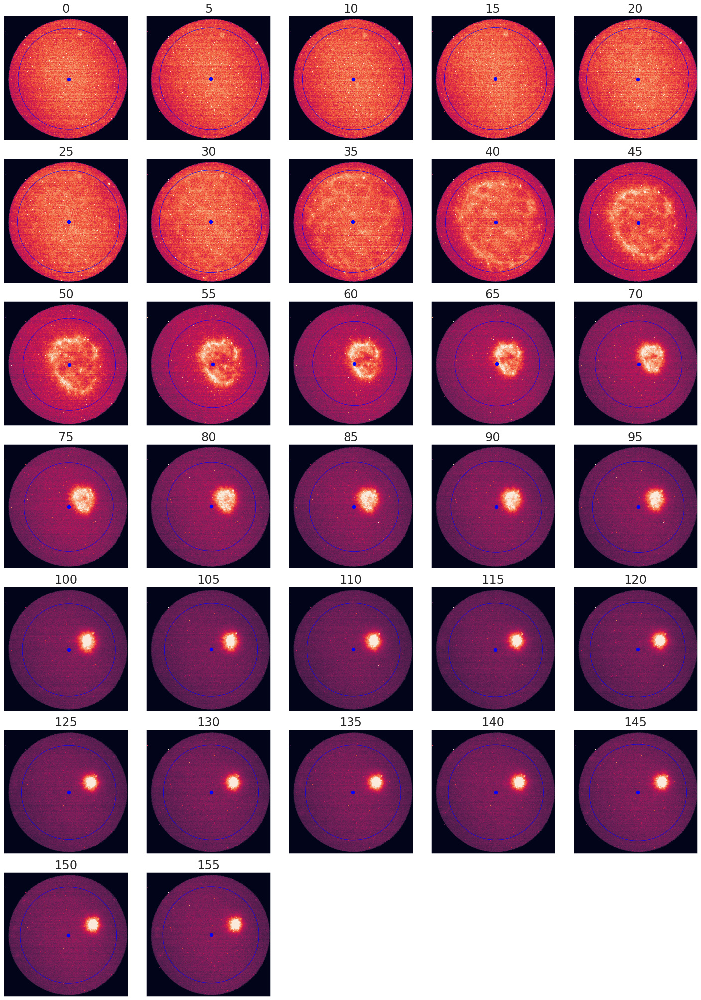

In [9]:
overlayCenters(ims_d7c2r1p0, 
               radii_d7c2r1p0, 
               centers_d7c2r1p0,
               xmin = 600,
               xmax = 1300,
               ymin = 250,
               ymax = 950)

12-07-2023 0.6 r2 p0

In [10]:
## Now, try parallel!
coordsRepeatList=itertools.repeat(tuple(coords_d7c6r2p0), len(ims_d7c6r2p0))
cent_and_radii_d7c6r2p0=list(concurrent.futures.ThreadPoolExecutor().map(
    center_identification, # the function
    ims_d7c6r2p0,
    coordsRepeatList, # the list of things to evaluate the function on
    )) # the second argument of the function
centers_d7c6r2p0=np.array([cr[0] for cr in cent_and_radii_d7c6r2p0])
radii_d7c6r2p0=np.array([cr[1] for cr in cent_and_radii_d7c6r2p0])

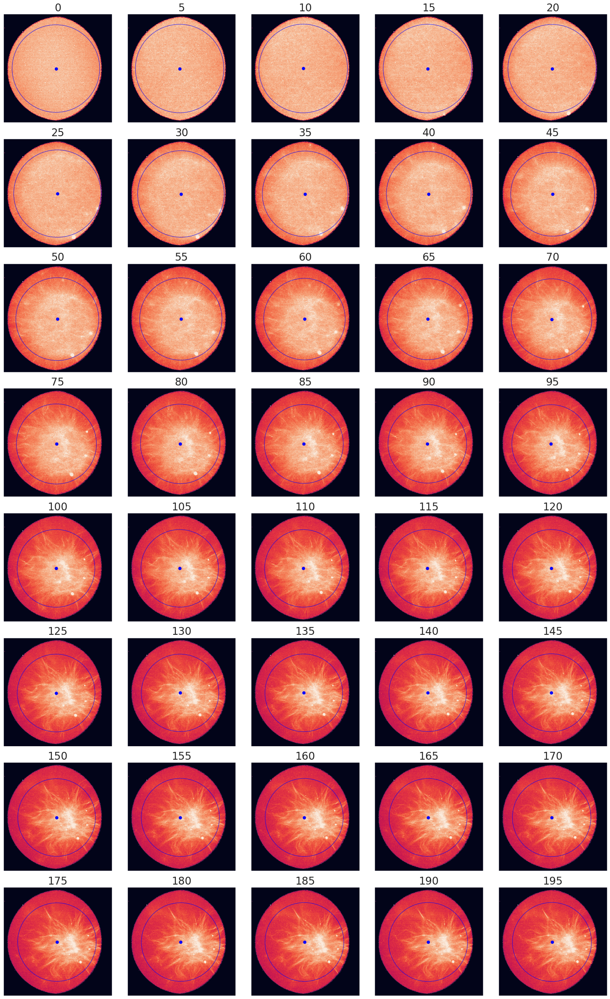

In [11]:
overlayCenters(ims_d7c6r2p0, 
               radii_d7c6r2p0, 
               centers_d7c6r2p0,
               xmin = 600,
               xmax = 1300,
               ymin = 250,
               ymax = 950)

12-12-2023 0.6 r2 p1

In [12]:
## Now, try parallel!
coordsRepeatList=itertools.repeat(tuple(coords_d12c6r2p1), len(ims_d12c6r2p1))
cent_and_radii_d12c6r2p1=list(concurrent.futures.ThreadPoolExecutor().map(
    center_identification, # the function
    ims_d12c6r2p1,
    coordsRepeatList, # the list of things to evaluate the function on
    )) # the second argument of the function
centers_d12c6r2p1=np.array([cr[0] for cr in cent_and_radii_d12c6r2p1])
radii_d12c6r2p1=np.array([cr[1] for cr in cent_and_radii_d12c6r2p1])

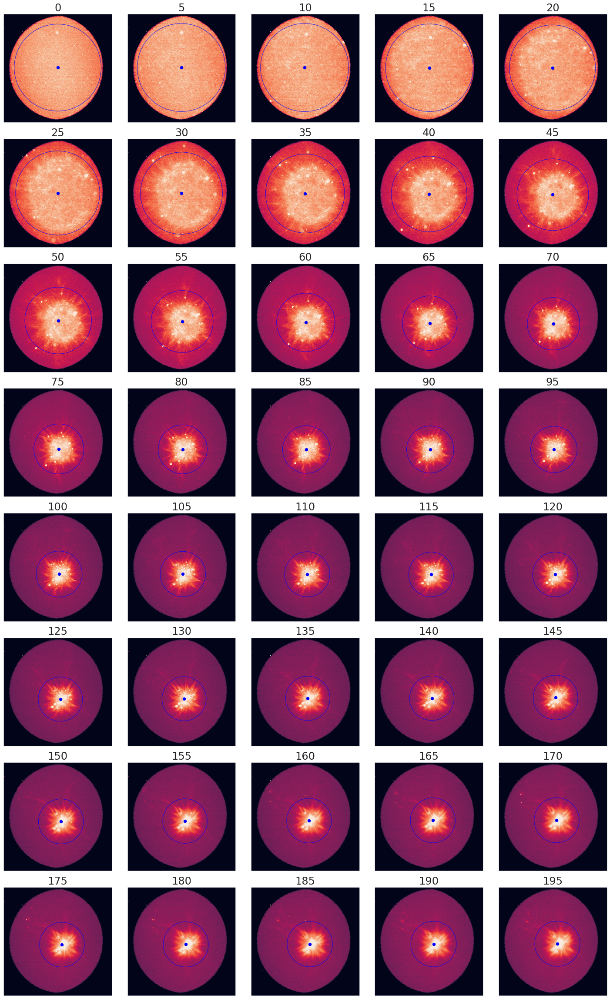

In [13]:
overlayCenters(ims_d12c6r2p1, 
               radii_d12c6r2p1, 
               centers_d12c6r2p1,
               xmin = 600,
               xmax = 1300,
               ymin = 250,
               ymax = 950)

# Fit to an (angularly symmetric) Gaussian

Namely, given an image $I(\vec{x})$ for $\vec{x}=(x,y)$, fit
$$\hat{I}(\vec{x}|\sigma, \vec{\mu}) = I_0 \frac{1}{2\pi \sigma^2} \exp\left[-\frac{1}{2 \sigma^2} (\vec{x}-\vec{\mu})^\top (\vec{x}-\vec{\mu})\right],$$
or
$$\hat{I}(x,y|\sigma, \vec{\mu}) = I_0 \frac{1}{2\pi \sigma^2} \exp\left[-\frac{1}{2 \sigma^2} \left((x-\mu_x)^2+ (y-\mu_y)^2\right)\right],$$
where $\vec{\mu}=(\mu_x, \mu_y)$ is the mode of the gaussian (e.g. peak = inferred center of aster) and we enforced angular symmetry by requiring that the covariance matrix is diagonal with the same element $\sigma$ along the diagonal.

In [122]:
def callback(xk):
    print("Current x:", xk)

In [123]:
def evalGauss2Dsimple(coord,pVec):
    muy, mux, sigma, I0 = pVec; # unpacked
    I_flat=coord[0] #y coords
    J_flat=coord[1] #x coords
    return I0 * 1/(2*np.pi*sigma**2)*np.exp(-((I_flat - muy)**2 + (J_flat - mux)**2)/(2*sigma**2)) 

def gauss2Dfit(vals, coord):
    residual=lambda pvec: np.sum((vals-evalGauss2Dsimple(coord, pvec))**2)
    initialGuess=(np.median(coord[0]),
                  np.median(coord[1]),
                  np.std(coord[0]),       
                  np.percentile(vals, 99)) 
    print(f'muy0: {round(initialGuess[0])}, mux0: {round(initialGuess[1])}, sigma0: {round(initialGuess[2])}, I0: {initialGuess[3]}')
    print(initialGuess)
    bounds=[(min(coord[0]), max(coord[0])), #limits on muy are the image coordinates subsampled on display!
            (min(coord[1]), max(coord[1])), #limits on mux are ^""
            (0, None), #limits on sigma are just positivity
            (0, None)] #limits on I0 are just positivity: GOOD VIBES ONLY
    #print(bounds)
    result=scipy.optimize.minimize(residual, 
                                   initialGuess, 
                                   method='L-BFGS-B', 
                                   bounds=bounds,
                                   callback=callback, #prints the starting params for each step
                                   options={'gtol':1e-7, #how small the gradient should be 
                                            'maxiter':1000},
                                  )

    return result #(result.x[1], result.x[0]), result.x[2], result.x[3]

## synthetic gaussian

##### Problem 1: The initial parameter guess needs to be close.

A fit is evaluated by minimizing the sum of the square of the residuals between a the fit and our input,
$$\sum \left(\text{Img} - G(\theta)\right)^2,$$
where $\theta$ is the set of fit parameters and $G(\theta)$ is the functional form of the fit. To find the best fit, we use a solver that will try many parameter values. To begin, we provide an inital guess of the parameters. The solver will then make small modifications to the parameters and compare how the sum of the square of the residuals compare between fits. If the sum of the square of residuals reduces, the solver should keep stepping in that direction until it hits a local minimum, at which it reports the best fitting parameters.

However, imagine the parameters begin infinitely far away from the best fitting parameters. The solver would be iterating indefinitely to find the right parameters. Instead, when the solver takes a step and the sum of the square of residuals barely changes from the previous step, it will cut itself off. This may happen naturally if the difference is smaller than what the machine distinguises as the smallest differnce between floating point nubmers (denoted EPSMCH) or it can happy if the user imposes a convergence tolerance (i.e. gtol).

The following example demonstrates an initial guess that is very far from the ground truth parameters resulting in a convergence cut off.

Make a synthetic image of a Gaussian centered at 30, 20, with a sigma of 10, and an peak intensity of 5.

In [99]:
onesImg=np.ones((100, 200))
I_flat, J_flat = np.where(onesImg)
synthGauss = evalGauss2Dsimple([I_flat, J_flat], (30, 20, 10, 5))
synthGaussImg = np.zeros_like(onesImg)
synthGaussImg[I_flat, J_flat] = synthGauss

Attempt to find the best fit parameters to the synthetic image. The function currently picks the center of the image as the x, y mean locations, the standard deviaiton of the image as the sigma value, and the 99th percentile intensity of the image as the peak intensity value

In [100]:
synthFit = gauss2Dfit(synthGaussImg.flatten(), np.where(~np.isnan(synthGaussImg)))
synthFit

muy0: 50, mux0: 100, sigma0: 29, I0: 0.005749689992562087
(np.float64(49.5), np.float64(99.5), np.float64(28.86607004772212), np.float64(0.005749689992562087))
Current x: [4.95000000e+01 9.95000000e+01 2.88660701e+01 5.79561610e-03]


  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: 0.01985700603236658
        x: [ 4.950e+01  9.950e+01  2.887e+01  5.796e-03]
      nit: 1
      jac: [ 5.551e-09  2.325e-08 -4.406e-08 -4.592e-05]
     nfev: 10
     njev: 2
 hess_inv: <4x4 LbfgsInvHessProduct with dtype=float64>

the message from the solver says the difference in the sum of the square of residuals after a step is so low that it stops. We see only one iteration (nit:1) occured. We printed the initial guess as well as the parameter values after one step, so we can see the difference.

In [101]:
ssr_init = np.sum((synthGauss.flatten() - evalGauss2Dsimple([I_flat, J_flat], (49.5, 99.5, 28.86607004772212, 0.005749689992562087)).flatten())**2)
ssr_step1 = np.sum((synthGauss.flatten() - evalGauss2Dsimple([I_flat, J_flat], (49.5, 99.5, 28.8660701, 0.00579561610)).flatten())**2)
print('Difference in the S.S.R.: ' + str(ssr_init-ssr_step1))

Difference in the S.S.R.: 2.1090077219343417e-09


Since this difference is smaller than our inputted gtol of 1e-7, the solver quit - we can see what it outputted for the image fit

In [102]:
## plot fit result
synthFitImg=np.ones_like(onesImg)
I_flat, J_flat = np.where(synthFitImg)
synthFitImg[I_flat, J_flat] = evalGauss2Dsimple([I_flat, J_flat], synthFit.x)

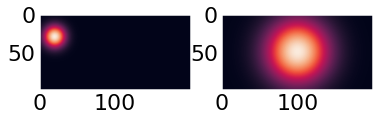

In [103]:
fig, ax = plt.subplots(1,2)
ax[0].imshow(synthGaussImg)
ax[1].imshow(synthFitImg)

Show it is corrected by a closer initial guess

If we instead pick a closer initial guess, the solver can find the right solution. Let's change the initial guess of the x-coordinate mean to 50.

In [104]:
onesImg=np.ones((100, 200))
I_flat, J_flat = np.where(onesImg)
synthGauss = evalGauss2Dsimple([I_flat, J_flat], (30, 50, 10, 5))
synthGaussImg = np.zeros_like(onesImg)
synthGaussImg[I_flat, J_flat] = synthGauss

synthFit = gauss2Dfit(synthGaussImg.flatten(), np.where(~np.isnan(synthGaussImg)))
synthFit

muy0: 50, mux0: 100, sigma0: 29, I0: 0.005749689992562087
(np.float64(49.5), np.float64(99.5), np.float64(28.86607004772212), np.float64(0.005749689992562087))
Current x: [4.95000000e+01 9.94999999e+01 2.88660701e+01 6.12280785e-03]
Current x: [49.4219299  99.31450487 28.98318998  2.01970989]
Current x: [42.00037034 80.51172208 52.38129296 12.27029508]
Current x: [34.67004304 64.94269098 61.45346301 17.20865885]
Current x: [ 0.         25.89861735 48.15469587 20.51232445]
Current x: [ 0.         45.60665832 42.57142695 14.78087697]
Current x: [ 0.72398463 45.6564486  40.63635508 15.60515453]
Current x: [ 3.41999575 45.939091   34.08696927 15.63535608]
Current x: [14.03812978 48.05403908 16.38774224  4.68822263]
Current x: [14.74289394 48.15662586 16.36020265  5.43907348]
Current x: [19.62821884 48.87201101 16.68219996  8.13621338]
Current x: [26.10589907 49.78633677 16.91386432  9.83263162]
Current x: [28.76940771 50.04265807 15.18416508  8.63703802]
Current x: [28.81445113 50.0408276 

/tmp/ipykernel_280698/570300270.py:5: RuntimeWarning: invalid value encountered in scalar divide
  return I0 * 1/(2*np.pi*sigma**2)*np.exp(-((I_flat - muy)**2 + (J_flat - mux)**2)/(2*sigma**2))
/tmp/ipykernel_280698/570300270.py:5: RuntimeWarning: divide by zero encountered in divide
  return I0 * 1/(2*np.pi*sigma**2)*np.exp(-((I_flat - muy)**2 + (J_flat - mux)**2)/(2*sigma**2))
/tmp/ipykernel_280698/570300270.py:5: RuntimeWarning: divide by zero encountered in scalar divide
  return I0 * 1/(2*np.pi*sigma**2)*np.exp(-((I_flat - muy)**2 + (J_flat - mux)**2)/(2*sigma**2))
/tmp/ipykernel_280698/570300270.py:5: RuntimeWarning: invalid value encountered in multiply
  return I0 * 1/(2*np.pi*sigma**2)*np.exp(-((I_flat - muy)**2 + (J_flat - mux)**2)/(2*sigma**2))


  message: CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL
  success: True
   status: 0
      fun: 7.104016940942717e-14
        x: [ 3.000e+01  5.000e+01  1.000e+01  5.000e+00]
      nit: 24
      jac: [-1.562e-09 -5.594e-10  9.897e-09 -1.192e-08]
     nfev: 260
     njev: 52
 hess_inv: <4x4 LbfgsInvHessProduct with dtype=float64>

We see it took many more steps and produced a different message. Let's now visualize the fit Gaussian!

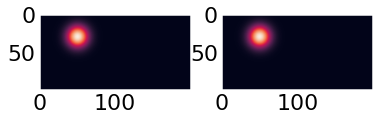

In [105]:
## plot fit result
synthFitImg=np.ones_like(onesImg)
I_flat, J_flat = np.where(synthFitImg)
synthFitImg[I_flat, J_flat] = evalGauss2Dsimple([I_flat, J_flat], synthFit.x)

fig, ax = plt.subplots(1,2)
ax[0].imshow(synthGaussImg)
ax[1].imshow(synthFitImg)

##### Does it work when the image is not a rectangle?

Now we will do a mango skin vibe thing

In [143]:
#make a circular mask
mask = np.zeros((200,200))
for i in range(200):
    for j in range(200):
        if (i-100)**2 + (j-100)**2 <= 10000:
            mask[i,j]=1
#find coordinates of mask
mask_coords = (np.where(mask==1))

#make a synthetic Gaussian
onesImg=np.ones((200, 200))
I_flat, J_flat = np.where(onesImg)
synthGauss = evalGauss2Dsimple([I_flat, J_flat], (50, 50, 10, 5))
synthGaussImg = np.zeros_like(onesImg)
synthGaussImg[I_flat, J_flat] = synthGauss

#find values of image in the masked region
vals = synthGaussImg[mask_coords]

In [144]:
synthFit = gauss2Dfit(vals, mask_coords)
synthFit

muy0: 100, mux0: 100, sigma0: 50, I0: 0.004826617631502696
(np.float64(100.0), np.float64(100.0), np.float64(49.999312324311525), np.float64(0.004826617631502696))
Current x: [1.00000000e+02 1.00000000e+02 4.99993123e+01 5.06018254e-03]
Current x: [99.91071498 99.73354635 50.08784097  3.7718323 ]
Current x: [76.73491701 76.35038854 73.7392935  12.49256564]
Current x: [41.16881008 40.67007266 90.79245018 22.36356066]
Current x: [ 4.62142532  4.07442626 93.37379238 31.22055885]
Current x: [ 0.          0.         76.87081447 35.85115435]
Current x: [ 0.          0.         55.04586964 36.5997969 ]
Current x: [ 0.36592582  0.3659334  54.49735801 36.98321125]
Current x: [ 4.65210871  4.65203355 46.88724644 38.06662384]
Current x: [ 4.09469299  4.09467953 49.06413791 36.33041274]
Current x: [11.6500694  11.65012997 45.88952076 24.72413991]
Current x: [35.66549038 35.66568209 32.45040229  8.34167704]
Current x: [35.98566221 35.98584729 31.27515022 10.45081414]
Current x: [37.19150529 37.1916

/tmp/ipykernel_280698/570300270.py:5: RuntimeWarning: divide by zero encountered in scalar divide
  return I0 * 1/(2*np.pi*sigma**2)*np.exp(-((I_flat - muy)**2 + (J_flat - mux)**2)/(2*sigma**2))
/tmp/ipykernel_280698/570300270.py:5: RuntimeWarning: divide by zero encountered in divide
  return I0 * 1/(2*np.pi*sigma**2)*np.exp(-((I_flat - muy)**2 + (J_flat - mux)**2)/(2*sigma**2))
/tmp/ipykernel_280698/570300270.py:5: RuntimeWarning: invalid value encountered in multiply
  return I0 * 1/(2*np.pi*sigma**2)*np.exp(-((I_flat - muy)**2 + (J_flat - mux)**2)/(2*sigma**2))
/tmp/ipykernel_280698/570300270.py:5: RuntimeWarning: invalid value encountered in scalar divide
  return I0 * 1/(2*np.pi*sigma**2)*np.exp(-((I_flat - muy)**2 + (J_flat - mux)**2)/(2*sigma**2))


Current x: [39.89851842 39.89858116 24.08380643  9.79586306]
Current x: [43.34560931 43.34562674 18.33179491 10.44055301]
Current x: [43.46017323 43.46019024 18.44228281  9.99826031]
Current x: [44.45681456 44.45682598 18.12476656  7.46778735]
Current x: [45.27665291 45.27666155 17.26798854  6.55304163]
Current x: [47.05254118 47.05254443 15.17600698  5.1879812 ]
Current x: [49.18304863 49.18304604 12.49387018  4.01405573]
Current x: [51.09929196 51.09928472  9.90992549  3.58809745]
Current x: [51.31127283 51.31126809  8.97020666  4.57952495]
Current x: [49.477027   49.47702818 11.13655632  5.57855562]
Current x: [50.01439885 50.01439846 10.3115693   5.12306083]
Current x: [50.00238722 50.00238732  9.92435374  4.97888817]
Current x: [50.00448913 50.00448912 10.00516661  5.00252409]
Current x: [50.00223378 50.00223377 10.00040084  5.00064796]
Current x: [50.00056177 50.00056177  9.99982296  5.00012367]


  message: CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH
  success: True
   status: 0
      fun: 1.0480200931505277e-10
        x: [ 5.000e+01  5.000e+01  1.000e+01  5.000e+00]
      nit: 31
      jac: [ 1.117e-07  1.117e-07 -2.391e-07  3.378e-07]
     nfev: 345
     njev: 69
 hess_inv: <4x4 LbfgsInvHessProduct with dtype=float64>

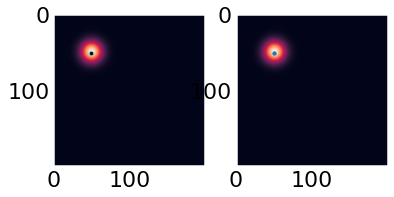

In [151]:
## plot fit result
synthFitImg=np.ones_like(onesImg)
I_flat, J_flat = np.where(synthFitImg)
synthFitImg[I_flat, J_flat] = evalGauss2Dsimple([I_flat, J_flat], synthFit.x)

fig, ax = plt.subplots(1,2)
ax[0].imshow(synthGaussImg)
ax[0].scatter(synthFit.x[1], synthFit.x[0], s=5)
ax[0].scatter(50, 50, s=1, color='k')
ax[1].imshow(synthFitImg)
ax[1].scatter(synthFit.x[1], synthFit.x[0], s=5)

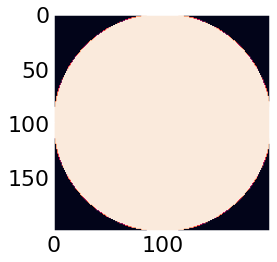

In [147]:
plt.imshow(mask)

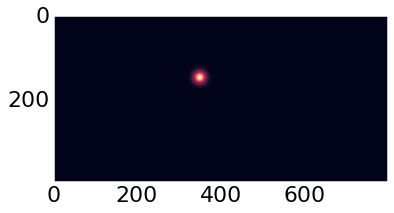

In [135]:
onesImg=np.ones((400, 800))
I_flat, J_flat = np.where(onesImg)
synthGauss = evalGauss2Dsimple([I_flat, J_flat], (150, 350, 10, 5))
synthGaussImg = np.zeros_like(onesImg)
synthGaussImg[I_flat, J_flat] = synthGauss



plt.imshow(mask*synthGaussImg)


# resume

In [50]:
## Now, try parallel!
coordsRepeatList=itertools.repeat(tuple(coords_d7c2r1p0), len(vals_d7c2r1p0))
cent_and_radii_d7c2r1p0=list(concurrent.futures.ThreadPoolExecutor().map(
    gauss2Dfit, # the function
    vals_d7c2r1p0,
    coordsRepeatList, # the list of things to evaluate the function on
    )) # the second argument of the function
centers_d7c2r1p0=np.array([cr[0] for cr in cent_and_radii_d7c2r1p0])
radii_d7c2r1p0=np.array([cr[1] for cr in cent_and_radii_d7c2r1p0])

/tmp/ipykernel_271189/4122982855.py:19: OptimizeWarning: Unknown solver options: gtol
  result=scipy.optimize.minimize(residual,
/tmp/ipykernel_271189/4122982855.py:5: RuntimeWarning: divide by zero encountered in scalar divide
  return I0 * 1/(2*np.pi*sigma**2)*np.exp(-((I_flat - muy)**2 + (J_flat - mux)**2)/(2*sigma**2))
/tmp/ipykernel_271189/4122982855.py:5: RuntimeWarning: divide by zero encountered in divide
  return I0 * 1/(2*np.pi*sigma**2)*np.exp(-((I_flat - muy)**2 + (J_flat - mux)**2)/(2*sigma**2))
/tmp/ipykernel_271189/4122982855.py:5: RuntimeWarning: invalid value encountered in multiply
  return I0 * 1/(2*np.pi*sigma**2)*np.exp(-((I_flat - muy)**2 + (J_flat - mux)**2)/(2*sigma**2))


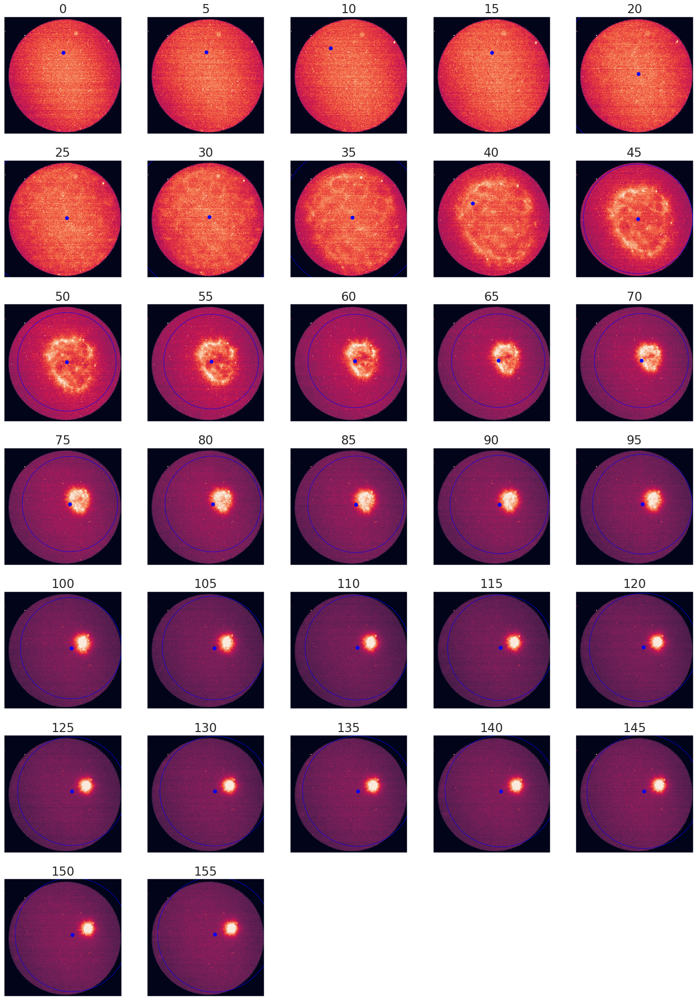

In [51]:
overlayCenters(ims_d7c2r1p0, 
               radii_d7c2r1p0, 
               centers_d7c2r1p0,
               xmin = 600,
               xmax = 1300,
               ymin = 250,
               ymax = 950)